# Import Modules and Read Data

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import pearsonr, f_oneway
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Set global styling
sns.set(style="darkgrid", palette="magma")
plt.rcParams.update({'font.size': 14, 'figure.figsize': (12, 8)})
pd.options.display.float_format = '{:.2f}'.format

# Load data
train_df = pd.read_csv("data/train.csv")

# Data Preprocessing

In [5]:
# Create new features
train_df['TempRange_Upper'] = train_df['MaxOfUpperTRange'] - train_df['MinOfUpperTRange']
train_df['TempRange_Lower'] = train_df['MaxOfLowerTRange'] - train_df['MinOfLowerTRange']
train_df['TotalPollinators'] = train_df[['honeybee', 'bumbles', 'andrena', 'osmia']].sum(axis=1)
train_df['FruitEfficiency'] = train_df['fruitmass'] / train_df['seeds']

# Interaction features
train_df['CloneSize_x_FruitSet'] = train_df['clonesize'] * train_df['fruitset']
train_df['Pollinators_x_Temp'] = train_df['TotalPollinators'] * train_df['AverageOfUpperTRange']

# Drop redundant columns
train_df.drop(['id', 'Row#'], axis=1, inplace=True)

# Visualizations

In [6]:
fig = px.scatter_3d(
    train_df,
    x='clonesize',
    y='fruitset',
    z='yield',
    color='fruitmass',
    size='seeds',
    opacity=0.7,
    title="3D Relationship: Clone Size, Fruit Set, and Yield",
    labels={'clonesize': 'Clone Size', 'fruitset': 'Fruit Set %', 'yield': 'Yield'}
)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=30))
fig.show()

/tmp/ipykernel_63374/2342295854.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




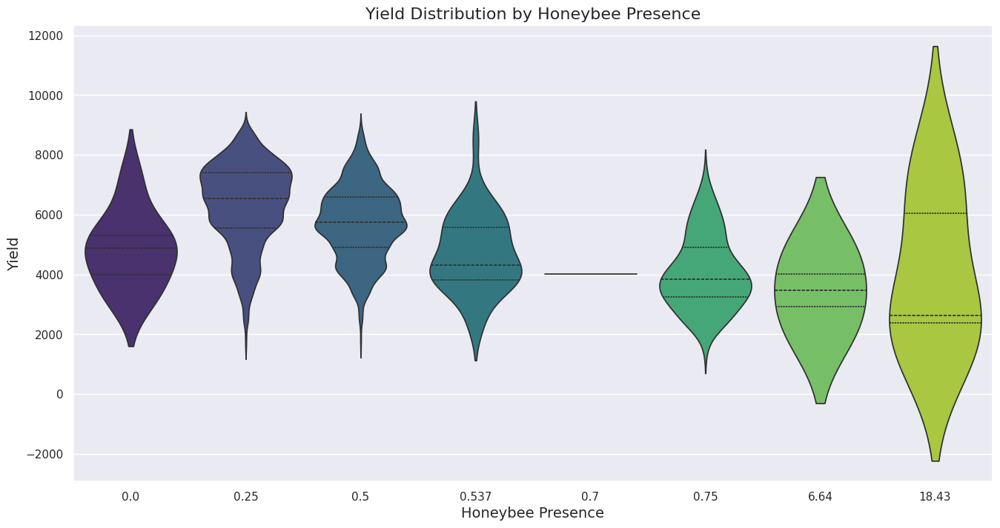

In [7]:
plt.figure(figsize=(16, 8))
sns.violinplot(data=train_df, x='honeybee', y='yield', inner="quartile", palette="viridis")
plt.title("Yield Distribution by Honeybee Presence", fontsize=16)
plt.xlabel("Honeybee Presence", fontsize=14)
plt.ylabel("Yield", fontsize=14)
plt.show()

/tmp/ipykernel_63374/2295469710.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




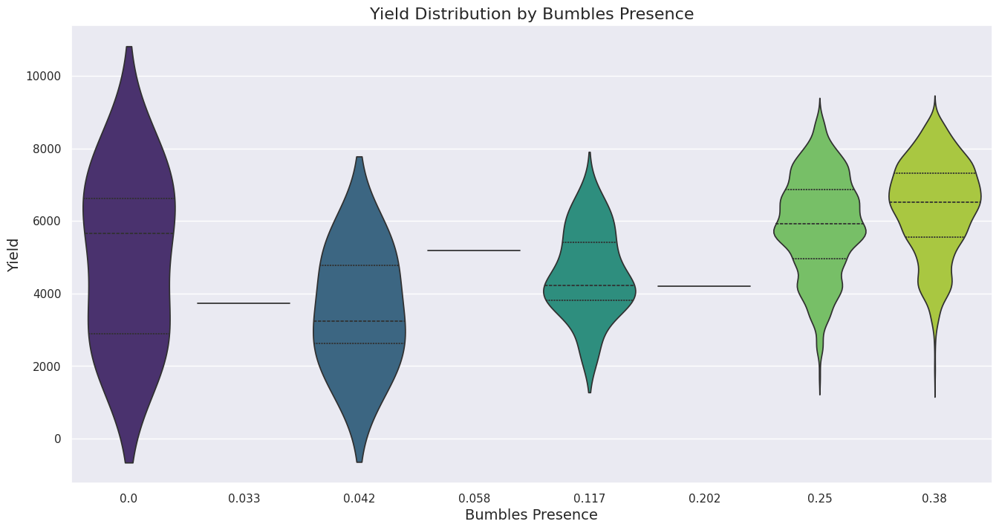

In [9]:
plt.figure(figsize=(16, 8))
sns.violinplot(data=train_df, x='bumbles', y='yield', inner="quartile", palette="viridis")
plt.title("Yield Distribution by Bumbles Presence", fontsize=16)
plt.xlabel("Bumbles Presence", fontsize=14)
plt.ylabel("Yield", fontsize=14)
plt.show()

In [8]:
fig = px.scatter_matrix(
    train_df,
    dimensions=["clonesize", "fruitset", "fruitmass", "seeds", "yield"],
    color="yield",
    title="Animated Correlation Matrix",
    labels={col: col.capitalize() for col in train_df.columns}
)
fig.update_traces(diagonal_visible=False, showupperhalf=False)
fig.show()